<h1><center> Site Energy Usage Intensity Prediction </center></h1>

### Contents

- **Introduction**
- **Exploratory Data Analysis**
- **Data Preprocessing**
- **Feature Engineering**
- **Baseline Modeling**
- **Hyperparameter Tuning**
- **Acknowledgements**
- **References**

### Importing libraries

In [1]:
%%capture
# File system manangement
import time, psutil, os, random

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
sns.set_theme()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Categorical data encoding
!pip install category_encoders
from category_encoders import TargetEncoder

# Regressors
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
!pip install catboost
from catboost import CatBoostRegressor

# Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Hyperparameter tuning
from sklearn.model_selection import KFold, cross_val_score, cross_validate
!pip install optuna
import optuna

# Warning suppression
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Recording the starting time, complemented with a stopping time check in the end to compute process runtime
start = time.time()

# Class representing the OS process and having memory_info() method to compute process memory usage
process = psutil.Process(os.getpid())

To make the results reproducible, we fix the random seeds. At later stages, we set `random_state = 0` in the regressors and `KFold` for cross-validation. Also, we set `seed = 0` in Optuna sampler.

In [3]:
# Setting random seeds
os.environ['PYTHONHASHSEED'] = '0'
random.seed(0)
np.random.seed(0)

# 1. Introduction

- Data
- Project Objective
- Evaluation Metric

## 1.1. Data

Source: https://www.kaggle.com/c/widsdatathon2022/data

The dataset contains roughly 100 thousand observations of building energy usage records collected over 7 years, in several states within the United States. It consists of building characteristics (e.g. floor area, facility type etc), weather data for the corresponding location of the building (e.g. annual average temperature, annual total precipitation etc) as well as the energy usage for the building in the given year, measured as Site Energy Usage Intensity (Site EUI). Each row in the data corresponds to a single building observed in a given year.

In [4]:
# Loading the data
data_train = pd.read_csv('https://raw.githubusercontent.com/sugatagh/Site-Energy-Usage-Intensity-Prediction/main/Dataset/train_dataset.csv')
X_test = pd.read_csv('https://raw.githubusercontent.com/sugatagh/Site-Energy-Usage-Intensity-Prediction/main/Dataset/X_test.csv')
y_test = pd.read_csv('https://raw.githubusercontent.com/sugatagh/Site-Energy-Usage-Intensity-Prediction/main/Dataset/y_test.csv')

### Training data

In [5]:
# Renaming the columns
data_train.rename(columns = {
    'Year_Factor': 'year_factor',
    'State_Factor': 'state_factor',
    'ELEVATION': 'elevation',
    'id': 'building_id'
}, inplace = True)

# Memory usage
print("Memory usage: {0:.2f} MB".format(data_train.memory_usage().sum()/(1024*1024)))

# Resetting index
data_train = data_train.reset_index(drop = True)

# Printing out the first 5 rows
data_train.head()

Memory usage: 36.99 MB


,year_factor,state_factor,building_class,facility_type,floor_area,year_built,energy_star_rating,elevation,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,building_id
0,1,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,11.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,248.682615,0
1,1,State_1,Commercial,Warehouse_Distribution_or_Shipping_center,274000.0,1955.0,45.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,26.500150,1
2,1,State_1,Commercial,Retail_Enclosed_mall,280025.0,1951.0,97.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,24.693619,2
3,1,State_1,Commercial,Education_Other_classroom,55325.0,1980.0,46.0,1.8,36,50.5,...,14,0,0,0,1.0,NaN,1.0,12.0,48.406926,3
4,1,State_1,Commercial,Warehouse_Nonrefrigerated,66000.0,1985.0,100.0,2.4,36,50.5,...,14,0,0,0,1.0,1.0,1.0,NaN,3.899395,4


### Test data

In [6]:
# Combining predictors and target
data_test = X_test.copy(deep = True)
data_test.insert(loc = len(X_test.columns)-1, column = 'site_eui', value = y_test['site_eui'])

# Renaming the columns
data_test.rename(columns = {
    'Year_Factor': 'year_factor',
    'State_Factor': 'state_factor',
    'ELEVATION': 'elevation',
    'id': 'building_id'
}, inplace = True)

# Memory usage
print("Memory usage: {0:.2f} MB".format(data_test.memory_usage().sum()/(1024*1024)))

# Printing out the first 5 rows
data_test.head()

Memory usage: 4.74 MB


,year_factor,state_factor,building_class,facility_type,floor_area,year_built,energy_star_rating,elevation,january_min_temp,january_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,building_id
0,7,State_1,Commercial,Grocery_store_or_food_market,28484.0,1994.0,37.0,2.4,38,50.596774,...,29,5,2,0,NaN,NaN,NaN,NaN,166.588554,75757
1,7,State_1,Commercial,Grocery_store_or_food_market,21906.0,1961.0,55.0,45.7,38,50.596774,...,29,5,2,0,NaN,NaN,NaN,NaN,259.381565,75758
2,7,State_1,Commercial,Grocery_store_or_food_market,16138.0,1950.0,1.0,59.1,38,50.596774,...,29,5,2,0,NaN,NaN,NaN,NaN,158.537090,75759
3,7,State_1,Commercial,Grocery_store_or_food_market,97422.0,1971.0,34.0,35.4,38,50.596774,...,29,5,2,0,NaN,NaN,NaN,NaN,261.441520,75760
4,7,State_1,Commercial,Grocery_store_or_food_market,61242.0,1942.0,35.0,1.8,38,50.596774,...,29,5,2,0,340.0,330.0,22.8,126.0,242.967711,75761


## 1.2. Project Objective

The objective is to predict the Site EUI, given building characteristics and the weather data for the location of the building.

## 1.3. Evaluation Metric

The true values of the target variable, Site EUI, is provided in the test dataset. We use the trained models to compute this variable for each row of the test dataset and evaluate the models in terms of the [Root Mean Square Error](https://en.wikipedia.org/wiki/Root-mean-square_deviation), which is defined as a scaled version of the $L_2$-distance between the vector of predicted values and the vector of true values of the target variable in the test dataset.

$$RMSE := \sqrt{\frac{\lVert \mathbf{y_{\text{pred}}} - \mathbf{y_{\text{true}}} \rVert_{2}^{2}}{N_{\text{test}}}} = \sqrt{\frac{\sum_{i=1}^{N_{\text{test}}} \left(y_{\text{pred},i} - y_{\text{true},i}\right)^2}{N_{\text{test}}}},$$

where
- $N_{test} = $ Number of observations in the test dataset
- $\mathbf{y_{\text{pred}}} = \left(y_{\text{pred}, 1}, y_{\text{pred}, 2}, \cdots, y_{\text{pred}, N_{\text{test}}}\right)$
    - $y_{\text{pred}, i} = $ Predicted value of the target variable corresponding to the $i$-th row of the test dataset
- $\mathbf{y_{\text{true}}} = \left(y_{\text{true}, 1}, y_{\text{true}, 2}, \cdots, y_{\text{true}, N_{\text{test}}}\right)$
    - $y_{\text{true}, i} = $ True value of the target variable corresponding to the $i$-th row of the test dataset
- $\lVert \cdot \rVert_2$ denotes the $L_2$-norm given by $\lVert \mathbf{x} \rVert_2 = \sqrt{x_1^2+x_2^2+\cdots+x_n^2},$ for $\mathbf{x}=\left(x_1,x_2,\cdots,x_n\right) \in \mathbb{R}^n$

# 2. Exploratory Data Analysis

- Understanding Features
- Basic Data Exploration
- Univariate Analysis
- Multivariate Analysis

## 2.1. Understanding Features

- **year_factor**: anonymized year in which the weather and energy usage factors were observed

- **state_factor**: anonymized state in which the building is located

- **building_class**: building classification

- **facility_type**: building usage type

- **floor_area**: floor area (in square feet) of the building

- **year_built**: year in which the building was constructed

- **energy_star_rating**: the energy star rating of the building

- **elevation**: elevation of the building location

- **january_min_temp**: minimum temperature in January (in Fahrenheit) at the location of the building

- **january_avg_temp**: average temperature in January (in Fahrenheit) at the location of the building

- **january_max_temp**: maximum temperature in January (in Fahrenheit) at the location of the building

*Similarly for all other months*

- **cooling_degree_days**: cooling degree day for a given day is the number of degrees where the daily average temperature exceeds 65 degrees Fahrenheit. Each month is summed to produce an annual total at the location of the building.

- **heating_degree_days**: heating degree day for a given day is the number of degrees where the daily average temperature   falls under 65 degrees Fahrenheit. Each month is summed to produce an annual total at the location of the building.

- **precipitation_inches**: annual precipitation in inches at the location of the building

- **snowfall_inches**: annual snowfall in inches at the location of the building

- **snowdepth_inches**: annual snow depth in inches at the location of the building

- **avg_temp**: average temperature over a year at the location of the building

- **days_below_30F**: total number of days below 30 degrees Fahrenheit at the location of the building

- **days_below_20F**: total number of days below 20 degrees Fahrenheit at the location of the building

- **days_below_10F**: total number of days below 10 degrees Fahrenheit at the location of the building

- **days_below_0F**: total number of days below 0 degrees Fahrenheit at the location of the building

- **days_above_80F**: total number of days above 80 degrees Fahrenheit at the location of the building

- **days_above_90F**: total number of days above 90 degrees Fahrenheit at the location of the building

- **days_above_100F**: total number of days above 100 degrees Fahrenheit at the location of the building

- **days_above_110F**: total number of days above 110 degrees Fahrenheit at the location of the building

- **direction_max_wind_speed**: wind direction for maximum wind speed at the location of the building. Given in 360-degree compass point directions (e.g. 360 = north, 180 = south, etc.).

- **direction_peak_wind_speed**: wind direction for peak wind gust speed at the location of the building. Given in 360-degree compass point directions (e.g. 360 = north, 180 = south, etc.).

- **max_wind_speed**: maximum wind speed at the location of the building

- **days_with_fog**: number of days with fog at the location of the building

- **building_id**: building id

### Target variable

- **site_eui**: Site Energy Usage Intensity is the amount of heat and electricity consumed by a building as reflected in utility bills

## 2.2. Basic Data Exploration

In [7]:
# Shape of the data
print(pd.Series({"Shape of the training data": data_train.shape,
                 "Shape of the test data": data_test.shape}).to_string())

Shape of the training data    (75757, 64)
Shape of the test data         (9705, 64)


In [8]:
# Count of observations
print(pd.Series({"Number of observations in the training dataset": len(data_train),
                 "Number of observations in the test dataset": len(data_test)}).to_string())

Number of observations in the training dataset    75757
Number of observations in the test dataset         9705


In [9]:
# Column names (same for the training set and the test set)
data_train.columns

Index(['year_factor', 'state_factor', 'building_class', 'facility_type',
       'floor_area', 'year_built', 'energy_star_rating', 'elevation',
       'january_min_temp', 'january_avg_temp', 'january_max_temp',
       'february_min_temp', 'february_avg_temp', 'february_max_temp',
       'march_min_temp', 'march_avg_temp', 'march_max_temp', 'april_min_temp',
       'april_avg_temp', 'april_max_temp', 'may_min_temp', 'may_avg_temp',
       'may_max_temp', 'june_min_temp', 'june_avg_temp', 'june_max_temp',
       'july_min_temp', 'july_avg_temp', 'july_max_temp', 'august_min_temp',
       'august_avg_temp', 'august_max_temp', 'september_min_temp',
       'september_avg_temp', 'september_max_temp', 'october_min_temp',
       'october_avg_temp', 'october_max_temp', 'november_min_temp',
       'november_avg_temp', 'november_max_temp', 'december_min_temp',
       'december_avg_temp', 'december_max_temp', 'cooling_degree_days',
       'heating_degree_days', 'precipitation_inches', 'snowfall_inc

In [10]:
# Count of columns
print(pd.Series({"Total number of columns in the training data": len(data_train.columns),
                 "Total number of columns in the test data": len(data_test.columns)}).to_string())

Total number of columns in the training data    64
Total number of columns in the test data        64


In [11]:
# Column datatypes (same for the training data and the test data)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(data_train.dtypes.to_string())

year_factor                    int64
state_factor                  object
building_class                object
facility_type                 object
floor_area                   float64
year_built                   float64
energy_star_rating           float64
elevation                    float64
january_min_temp               int64
january_avg_temp             float64
january_max_temp               int64
february_min_temp              int64
february_avg_temp            float64
february_max_temp              int64
march_min_temp                 int64
march_avg_temp               float64
march_max_temp                 int64
april_min_temp                 int64
april_avg_temp               float64
april_max_temp                 int64
may_min_temp                   int64
may_avg_temp                 float64
may_max_temp                   int64
june_min_temp                  int64
june_avg_temp                float64
june_max_temp                  int64
july_min_temp                  int64
j

In [12]:
# Count of column datatypes (same for the training data and the test data)
int_cols = data_train.columns[data_train.dtypes == 'int64'].tolist()
float_cols = data_train.columns[data_train.dtypes == 'float64'].tolist()
object_cols = data_train.columns[data_train.dtypes == 'object'].tolist()
print(pd.Series({"Number of integer columns": len(int_cols),
                 "Number of float columns": len(float_cols),
                 "Number of object columns": len(object_cols)}).to_string())

Number of integer columns    37
Number of float columns      24
Number of object columns      3


In [13]:
# Count of duplicate rows
print(pd.Series({"Number of duplicate rows in the training data": data_train.duplicated().sum(),
                 "Number of duplicate rows in the test data": data_test.duplicated().sum()}).to_string())

Number of duplicate rows in the training data    0
Number of duplicate rows in the test data        0


In [14]:
# Constant columns
constant_cols_train = data_train.columns[data_train.nunique() == 1].tolist()
constant_cols_test = data_test.columns[data_test.nunique() == 1].tolist()
if len(constant_cols_train) == 0:
    constant_cols_train = "None"
if len(constant_cols_test) == 0:
    constant_cols_test = "None"
print(pd.Series({"Constant columns in the training data": constant_cols_train,
                 "Constant columns in the test data": constant_cols_test}).to_string())

Constant columns in the training data                              None
Constant columns in the test data        [year_factor, days_above_110F]


In [15]:
# Columns with missing values in the training data and respective proportions
print((data_train.isna().sum()/len(data_train))[data_train.isna().sum() != 0].sort_values(ascending = False).to_string())

days_with_fog                0.604512
direction_peak_wind_speed    0.551909
direction_max_wind_speed     0.542287
max_wind_speed               0.542287
energy_star_rating           0.352561
year_built                   0.024249


In [16]:
# Columns with missing values in the test data and respective proportions
print((data_test.isna().sum()/len(data_test))[data_test.isna().sum() != 0].sort_values(ascending = False).to_string())

days_with_fog                0.939413
direction_max_wind_speed     0.883565
direction_peak_wind_speed    0.883565
max_wind_speed               0.883565
energy_star_rating           0.232251
year_built                   0.009480


In [17]:
# Statistical description of numerical variables in the training data
data_train.describe()

,year_factor,floor_area,year_built,energy_star_rating,elevation,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,building_id
count,75757.000000,7.575700e+04,73920.000000,49048.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,...,75757.000000,75757.000000,75757.000000,75757.000000,34675.000000,33946.000000,34675.000000,29961.000000,75757.000000,75757.000000
mean,4.367755,1.659839e+05,1952.306764,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,...,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,2.468758e+05,37.053619,28.663683,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,...,25.282913,10.943996,2.252323,0.142140,131.147834,130.308106,6.458789,50.699751,58.255403,21869.306509
min,1.000000,9.430000e+02,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,6.237900e+04,1927.000000,40.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,...,72.000000,6.000000,0.000000,0.000000,1.000000,1.000000,1.000000,88.000000,54.528601,18939.000000
50%,5.000000,9.136700e+04,1951.000000,67.000000,25.000000,11.000000,34.451613,59.000000,9.000000,34.107143,...,84.000000,12.000000,0.000000,0.000000,1.000000,1.000000,1.000000,104.000000,75.293716,37878.000000
75%,6.000000,1.660000e+05,1977.000000,85.000000,42.700000,13.000000,37.322581,62.000000,20.000000,40.879310,...,97.000000,17.000000,0.000000,0.000000,1.000000,1.000000,1.000000,131.000000,97.277534,56817.000000
max,6.000000,6.385382e+06,2015.000000,100.000000,1924.500000,49.000000,64.758065,91.000000,48.000000,65.107143,...,260.000000,185.000000,119.000000,16.000000,360.000000,360.000000,23.300000,311.000000,997.866120,75756.000000


In [18]:
# Statistical description of categorical variables in the training data
data_train.describe(include = ['O'])

,state_factor,building_class,facility_type
count,75757,75757,75757
unique,7,2,60
top,State_6,Residential,Multifamily_Uncategorized
freq,50840,43558,39455


In [19]:
# Statistical description of numerical variables in the test data
data_test.describe()

,year_factor,floor_area,year_built,energy_star_rating,elevation,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,building_id
count,9705.0,9.705000e+03,9613.000000,7451.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,...,9705.000000,9705.000000,9705.000000,9705.0,1130.000000,1130.000000,1130.000000,588.000000,9705.000000,9705.000000
mean,7.0,1.632143e+05,1963.219598,64.712924,205.231190,13.520762,36.678081,60.008449,21.705100,41.634886,...,66.820093,11.941267,0.211643,0.0,321.743363,310.194690,18.131327,150.755102,71.294284,80609.000000
std,0.0,2.624759e+05,40.819953,27.935984,264.822814,12.458365,6.968520,5.874699,9.774624,5.528689,...,30.936872,13.077936,0.615250,0.0,19.127690,38.969875,1.993348,58.760576,60.133602,2801.736515
min,7.0,5.982000e+03,0.000000,1.000000,1.800000,-1.000000,27.548387,42.000000,9.000000,33.428571,...,15.000000,1.000000,0.000000,0.0,280.000000,240.000000,14.800000,34.000000,-0.136703,75757.000000
25%,7.0,4.802000e+04,1929.000000,45.000000,26.500000,-1.000000,27.548387,54.000000,9.000000,36.053571,...,39.000000,3.000000,0.000000,0.0,310.000000,270.000000,16.500000,129.000000,36.751719,78183.000000
50%,7.0,8.248600e+04,1969.000000,72.000000,118.900000,15.000000,38.661290,59.000000,22.000000,41.625000,...,77.000000,5.000000,0.000000,0.0,330.000000,320.000000,18.300000,129.000000,60.029687,80609.000000
75%,7.0,1.775200e+05,1994.000000,88.000000,231.300000,21.000000,41.177419,64.000000,28.000000,45.685185,...,79.000000,12.000000,0.000000,0.0,340.000000,340.000000,19.200000,138.000000,84.619743,83035.000000
max,7.0,6.353396e+06,2016.000000,100.000000,812.000000,38.000000,50.596774,71.000000,40.000000,54.482143,...,122.000000,41.000000,2.000000,0.0,360.000000,350.000000,23.300000,250.000000,892.420387,85461.000000


In [20]:
# Statistical description of categorical variables in the test data
data_test.describe(include = ['O'])

,state_factor,building_class,facility_type
count,9705,9705,9705
unique,6,2,60
top,State_11,Commercial,Multifamily_Uncategorized
freq,3268,5607,2199


**Training data synopsis:**

- Number of observations: 85462
- Number of columns: 64
- Number of integer columns: 37
- Number of float columns: 24
- Number of object columns: 3
- Number of duplicate observations: 0
- Constant columns: None
- Number of columns with missing values: 6
- Columns with missing values: `year_built`, `energy_star_rating`, `direction_max_wind_speed`, `direction_peak_wind_speed`, `max_wind_speed`, `days_with_fog`
- Memory Usage: 37.57 MB

**Test data synopsis:**

- Number of observations: 9705
- Number of columns: 64
- Number of integer columns: 37
- Number of float columns: 24
- Number of object columns: 3
- Number of duplicate observations: 0
- Constant columns: `year_factor`, `days_above_110F`
- Number of columns with missing values: 6
- Columns with missing values: `year_built`, `energy_star_rating`, `direction_max_wind_speed`, `direction_peak_wind_speed`, `max_wind_speed`, `days_with_fog`
- Memory Usage: 4.74 MB

**Other observations:**

- The training set contains information of six years (`year_factor` = 1 to `year_factor` = 6) and the test set contains information of the seventh year (`year_factor` = 7)

## 2.3. Univariate Analysis

- Predictor variables
- Target variable

### 2.3.1 Predictor variables

In [21]:
# Combining the data
data_train_temp = data_train.copy(deep = True)
data_train_temp['dataset'] = "Train"
data_test_temp = data_test.copy(deep = True)
data_test_temp['dataset'] = "Test"
data = pd.concat([data_train_temp, data_test_temp], axis = 0, ignore_index = True)

In [22]:
# Add annotations
def add_annotations(ax, count = False):
    for p in ax.patches:
        frequency = p.get_height()
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + p.get_height()
        if count == True:
            ax.annotate("{:.0f}".format(frequency), (x, y), size = 12, ha = 'center', va = 'bottom')
        else:
            ax.annotate("{:.2f}".format(frequency), (x, y), size = 12, ha = 'center', va = 'bottom')

In [23]:
# Matplotlib patches for adding manual legends
grey_patch = mpatches.Patch(color = 'grey', label = "Train")
red_patch = mpatches.Patch(color = 'red', label = "Test")

In general, throughout the notebook, we choose the number of bins of a histogram by the [Freedman-Diaconis rule](https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule), which suggests the optimal number of bins to grow as $k \sim n^{1/3},$ where $n$ is the total number of observations.

In [24]:
bins_fd = math.floor(len(data)**(1./3))
bins_fd_train = math.floor(len(data_train)**(1./3))
bins_fd_test = math.floor(len(data_test)**(1./3))

**The *almost constant* column**

- The feature `days_above_110F` is *almost constant* in the sense that it is $0$ for $99.91\%$ of the training observations and for $100\%$ of the test observations
- The feature `days_above_100F` takes the value $0$ for $94.63\%$ of the training data and for $89.41\%$ of the test data

In [25]:
almost_constant_cols = ['days_above_110F']

**Columns with *unrealistic values* as majority**

- The feature `direction_max_wind_speed` is $1.0$ for $79.95\%$ of the training observations
- The feature `direction_peak_wind_speed` is $1.0$ for $81.59\%$ of the training observations
- The feature `max_wind_speed` is $1.0$ for $79.95\%$ of the training observations

In all the three columns for both training data and test data $1.0$ is an extremely isolated point

In [26]:
unrealistic_value_cols = ['direction_max_wind_speed', 'direction_peak_wind_speed', 'max_wind_speed']

There are $6$ observations in the training data and $1$ observation in the test data which were apparently built in the year $0$. These are probably incorrect because the year $0$ is an extremely isolated point in the `year_built` column for both the training data and the test data.

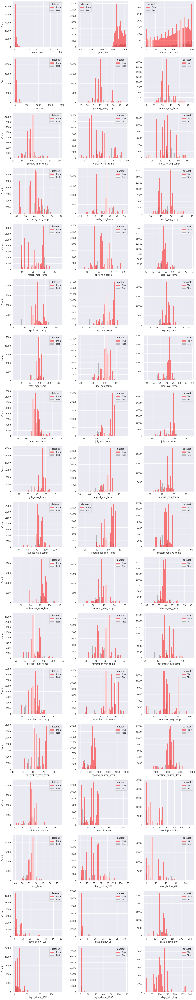

In [27]:
# Univariate distributions
data_temp = data.copy(deep = True)
data_temp['year_built'] = data_temp['year_built'].replace({0: np.nan})
excluded_cols = object_cols + almost_constant_cols + unrealistic_value_cols + ['year_factor', 'building_id', 'dataset', 'site_eui']
selected_cols = [col for col in data.columns if col not in excluded_cols]
fig, ax = plt.subplots(18, 3, figsize = (15, 4.2*18), sharey = False)
for i in range(len(selected_cols)):
    sns.histplot(data = data_temp, x = selected_cols[i], bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], ax = ax[i//3, i%3])
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

**Observations:**

- `floor_area` and `elevation` have positive skewness to an extreme degree
- `energy_star_rating` is negatively skewed to a moderate degree
---
- The oldest building in the dataset was built in the year $1600$
- The latest building in the dataset was built in the year $2016$
- Most buildings in both the training data and the test data were built after the year $1900$
- A massive number of buildings were built during the second half of $1920$'s and the beginning of $1960$'s
- The sudden drops in the count during the two world wars ($1914$-$1918$ and $1939$-$1945$) are clearly noticeable
---


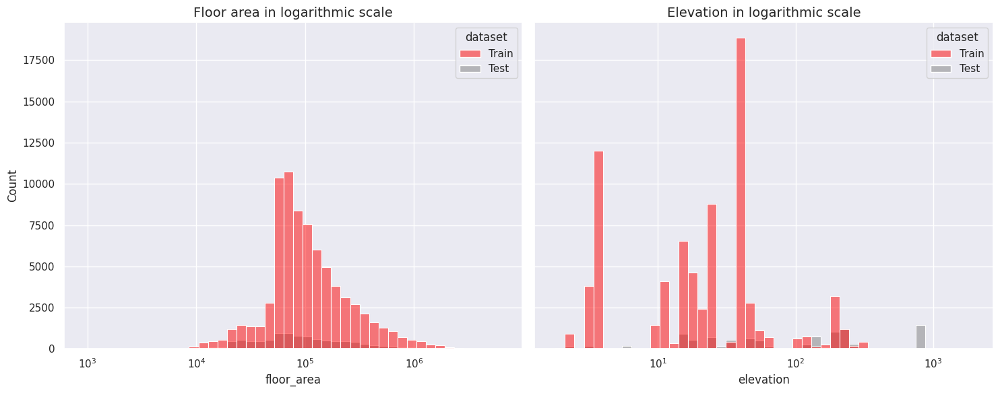

In [28]:
# Applying logarithmic scale on extremely skewed distributions
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharey = True)
sns.histplot(data = data, x = 'floor_area', bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], log_scale = True, ax = ax[0])
sns.histplot(data = data, x = 'elevation', bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], log_scale = True, ax = ax[1])
ax[0].set_title("Floor area in logarithmic scale", fontsize = 14)
ax[1].set_title("Elevation in logarithmic scale", fontsize = 14)
plt.tight_layout()
plt.show()

####  Frequency comparison by year

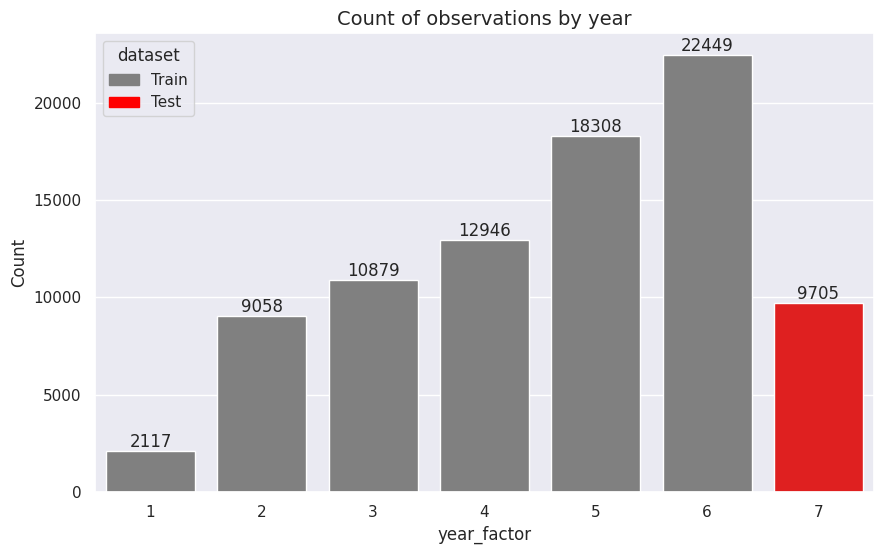

In [29]:
# Count of observations by year
plt.figure(figsize = (9, 6))
values = data['year_factor'].value_counts(sort = False)
idx = data['year_factor'].value_counts(sort = False).index
colors = ['grey' if (x != 7) else 'red' for x in idx]
ax = sns.barplot(x = idx, y = values, palette = colors)
ax.set(xlabel = "year_factor", ylabel = "Count")
ax.set_title("Count of observations by year", fontsize = 14)
add_annotations(ax, count = True)
plt.legend(handles = [grey_patch, red_patch], title = "dataset", loc = 'upper left')
plt.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()

####  Frequency comparison by state

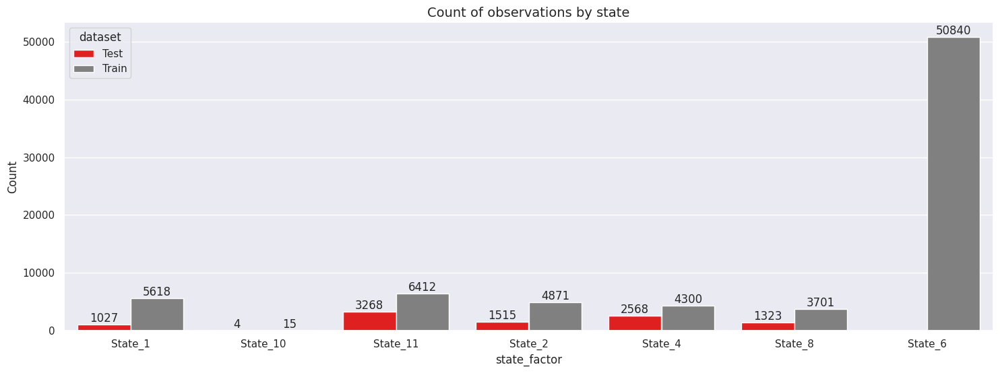

In [30]:
# Count of observations by state
plt.figure(figsize = (15, 6))
ax = sns.barplot(x = 'state_factor',
                 y = 'building_id',
                 data = data.groupby(['dataset', 'state_factor']).agg({'building_id': 'count'}).reset_index(),
                 hue = 'dataset',
                 palette = ['red', 'grey'])
ax.set(xlabel = "state_factor", ylabel = "Count")
ax.set_title("Count of observations by state", fontsize = 14)
add_annotations(ax, count = True)
plt.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()

**Observations:**

- Majority of the training data comes from `State_6`
- The test data has no observation from `State_6`

####  Frequency comparison by building class

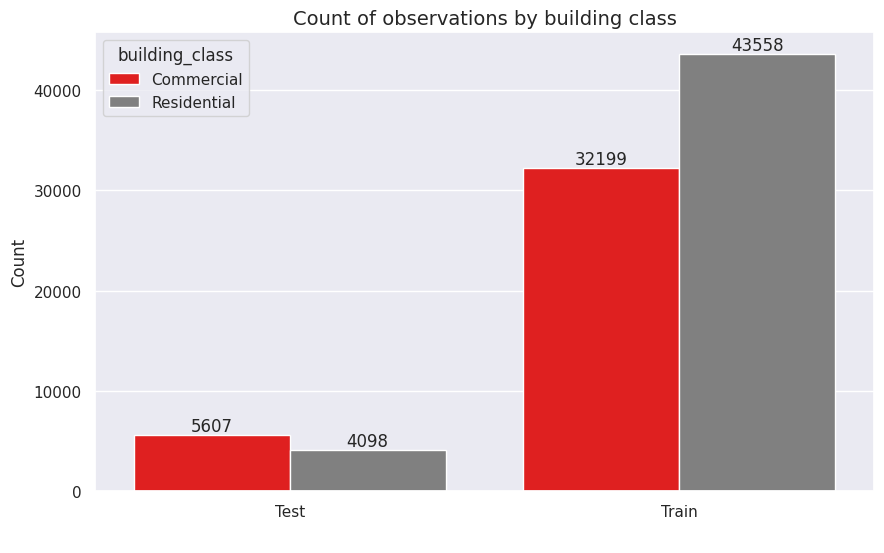

In [31]:
# Count of observations by building class
plt.figure(figsize = (9, 6))
ax = sns.barplot(x = 'dataset',
                 y = 'building_id',
                 data = data.groupby(['dataset', 'building_class']).agg({'building_id': 'count'}).reset_index(),
                 hue = 'building_class',
                 palette = ['red', 'grey'],
                 ci = False)
add_annotations(ax, count = True)
ax.set(xlabel = " ", ylabel = "Count")
plt.title("Count of observations by building class", fontsize = 14)
plt.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()

**Observations:**

- The training data contains more `residential` buildings
- The test data contains more `commercial` buildings

#### Frequency comparison by facility type

<Figure size 900x600 with 0 Axes>

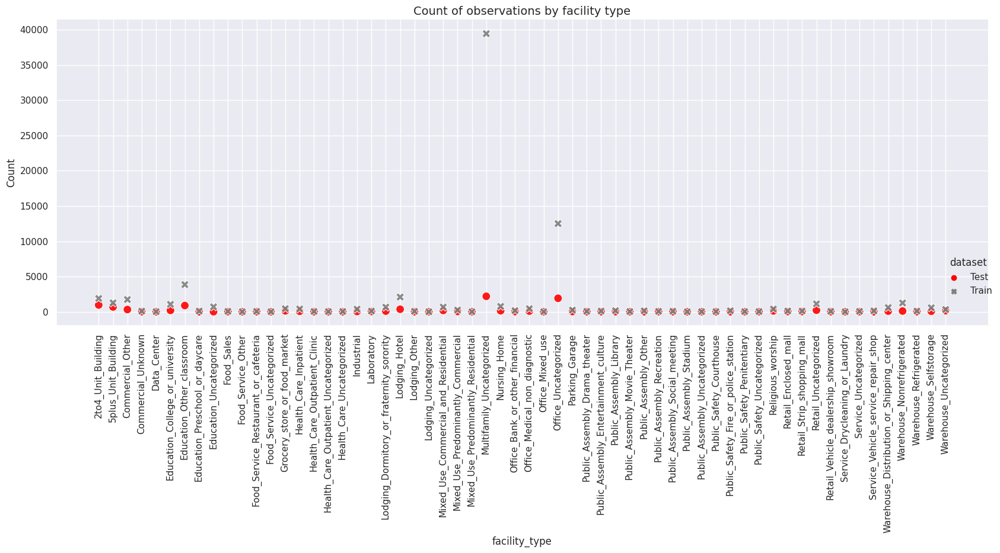

In [32]:
# Count of observations by facility type
plt.figure(figsize = (9, 6))
ax = sns.relplot(x = 'facility_type',
                 y = 'building_id',
                 data = data.groupby(['dataset', 'facility_type']).agg({'building_id': 'count'}).reset_index(),
                 hue = 'dataset',
                 style = 'dataset',
                 palette = ['red', 'grey'],
                 aspect = 1.6,
                 height = 10,
                 s = 100,
                 alpha = 0.9,
                 legend = 'auto'
                )
ax.set(ylabel = "Count")
ax.set_xticklabels(rotation = 90)
plt.title("Count of observations by facility type", fontsize = 14)
plt.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()

In [33]:
# Merging values with low frequencies in a column
def merge_val(data, col, cutoff = 0.01):
    data_temp = data.copy(deep = True)
    val_major_list = data[col].value_counts()[data[col].value_counts()/len(data) >= cutoff].index.tolist()
    val_minor_list = data[col].value_counts()[data[col].value_counts()/len(data) < cutoff].index.tolist()
    val_dict = {}
    for val in val_major_list:
        val_dict[val] = val
    for val in val_minor_list:
        val_dict[val] = 'Others'
    data_temp[col] = data_temp[col].map(val_dict)
    return data_temp

In [34]:
# Donutplots
def donut_train_test(data_train, data_test, col, merge_values = False, merge_cutoff = 0.02, title_text = "Title"):

    fig = make_subplots(rows = 1, cols = 2, column_widths = [0.5, 0.5], row_heights = [0.5], specs = [[ {"type": "pie"}, {"type": "pie"}]])

    if merge_values == True:
        data_train_temp = merge_val(data_train, col, cutoff = merge_cutoff)
        data_test_temp = merge_val(data_test, col, cutoff = merge_cutoff)
    else:
        data_train_temp = data_train.copy(deep = True)
        data_test_temp = data_test.copy(deep = True)

    fig.add_trace(go.Pie(
        labels = data_train_temp[col].value_counts().index,
        values = data_train_temp[col].value_counts(),
        legendgroup = "group",
        textinfo = 'percent',
        hole = 0.3),
        row = 1, col = 1)

    fig.add_trace(go.Pie(
        labels = data_test_temp[col].value_counts().index,
        values = data_test_temp[col].value_counts(),
        legendgroup = "group",
        textinfo = 'percent',
        hole = 0.3),
        row = 1, col = 2)

    fig.update_layout(
        # title_text = title_text,
        title = {'text': title_text, 'y': 0.9, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
        annotations = [dict(text = 'Train', x = 0.18, y = 0.5, font_size = 20, showarrow = False),
                      dict(text = 'Test', x = 0.81, y = 0.5, font_size = 20, showarrow = False)])

    fig.show()

In [35]:
donut_train_test(data_train,
                 data_test,
                 col = 'facility_type', merge_values = True, merge_cutoff = 0.015,
                 title_text = "Frequency comparison by facility type")

**Observations:**

- In the training data, more than $52\%$ of the buildings are `Multifamily_Uncategorized` and at a distant second, $16.5\%$ of the buildings are `Office_Uncategorized`
- In the test data, the distribution is more evenly spread out with `Multifamily_Uncategorized` and `Office_Uncategorized` respectively taking up $22.7\%$ and $19.8\%$ of the data

### 2.3.2. Target variable

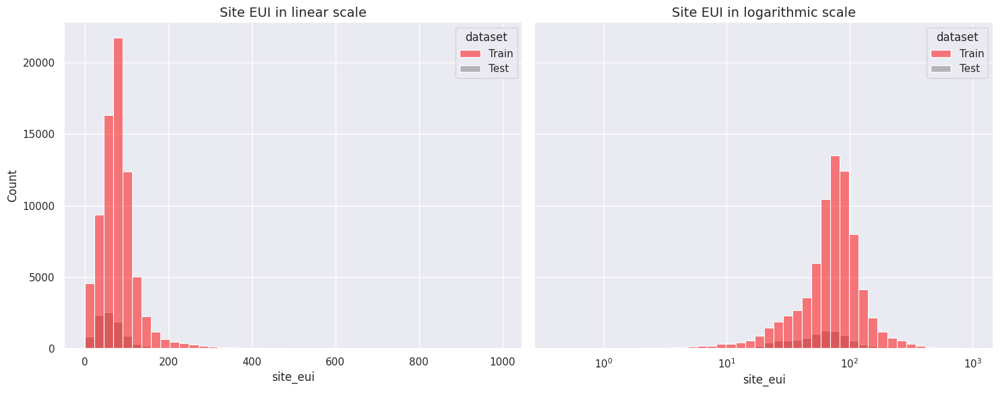

In [36]:
# Plotting Site EUI in linear and logarithmic scale
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharey = True)
sns.histplot(data = data, x = 'site_eui', bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], ax = ax[0])
sns.histplot(data = data, x = 'site_eui', bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], log_scale = True, ax = ax[1])
ax[0].set_title("Site EUI in linear scale", fontsize = 14)
ax[1].set_title("Site EUI in logarithmic scale", fontsize = 14)
plt.tight_layout()
plt.show()

**Observations:**

- The distribution of `site_eui` is positively skewed
- On the logarithmic scale it approaches a bell-shaped distribution

## 2.4. Multivariate Analysis

- Relationships among the predictor variables
- Relationships of the target variable with the predictor variables

### 2.4.1. Relationships among the predictor variables

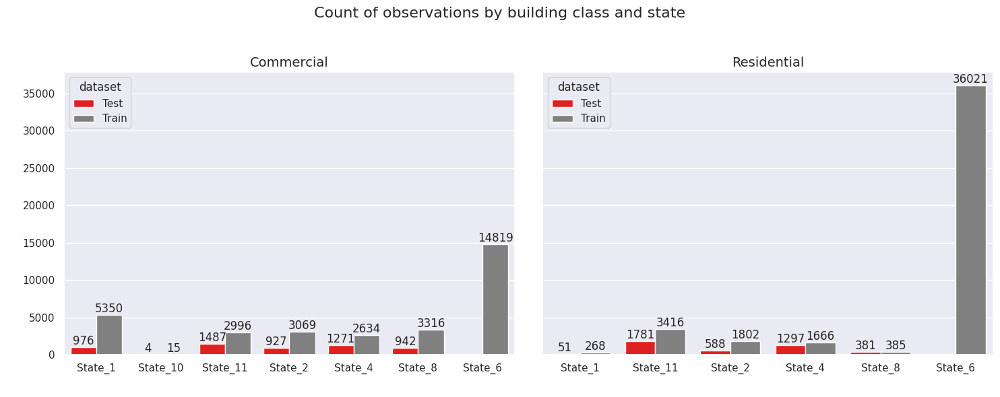

In [37]:
# Count of observations by building class and state
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharey = True)
for e, s in enumerate(data['building_class'].unique(), 0):
    sns.barplot(x = 'state_factor',
                y = 'building_id',
                data = data[data['building_class'] == s].groupby(['dataset', 'state_factor']).agg({'building_id': 'count'}).reset_index(),
                hue = 'dataset',
                palette = ['red', 'grey'],
                ax = ax[e],
                ci = False)
    ax[e].set_title(s, fontsize = 14)
    ax[e].set_ylabel(" ")
    ax[e].set_xlabel(" ")
    add_annotations(ax[e], count = True)
fig.suptitle("Count of observations by building class and state", fontsize = 16)
fig.tight_layout()
fig.tight_layout(rect = [0, 0, 1, 0.95])
plt.show()

**Observations:**

- The data from `State_10` only contains commercial buildings

We have observed in the [univariate analysis](#Univariate-Analysis) that `Multifamily_Uncategorized` and `Office_Uncategorized` make up majority of the buildings in both the training data and the test data. Clearly, `Multifamily_Uncategorized` buildings are mostly `residential` whereas the `Office_Uncategorized` buildings are mostly `commercial`. So we examine the facility types separately for residential and commercial buildings.

In [38]:
donut_train_test(data_train[data_train['building_class'] == 'Residential'],
                 data_test[data_test['building_class'] == 'Residential'],
                 col = 'facility_type', merge_values = True, merge_cutoff = 0.02,
                 title_text = "Frequency comparison by facility type for residential buildings")

In [39]:
donut_train_test(data_train[(data_train['building_class'] == 'Residential') & (data_train['facility_type'] == 'Multifamily_Uncategorized')],
                 data_test[(data_test['building_class'] == 'Residential') & (data_test['facility_type'] == 'Multifamily_Uncategorized')],
                 col = 'state_factor', merge_values = True, merge_cutoff = 0.03,
                 title_text = "Frequency Comparison by state for residential, uncategorized multifamily buildings")

In [40]:
donut_train_test(data_train[data_train['building_class'] == 'Commercial'],
                 data_test[data_test['building_class'] == 'Commercial'],
                 col = 'facility_type', merge_values = True, merge_cutoff = 0.02,
                 title_text = "Frequency comparison by facility type for commercial buildings")

In [41]:
donut_train_test(data_train[(data_train['building_class'] == 'Commercial') & (data_train['facility_type'] == 'Office_Uncategorized')],
                 data_test[(data_test['building_class'] == 'Commercial') & (data_test['facility_type'] == 'Office_Uncategorized')],
                 col = 'state_factor', merge_values = True, merge_cutoff = 0.03,
                 title_text = "Frequency Comparison by state for commercial, uncategorized office buildings")

**Observations:**

- Over 90% of the residential buildings in the training data are `Multifamily_Uncategorized`
- Over 90% of the residential, uncategorized multifamily buildings in the `training data` come from `State_6`
- Over 50% of the residential buildings in the test data are `Multifamily_Uncategorized`
- Over 50% of the residential, uncategorized multifamily buildings in the test data come from `State_4`
- Over one-third of the commercial buildings in both the training set and the test data are `Office_Uncategorized`
- Almost half of the commercial, uncategorized office buildings in the training data come from `State_6`

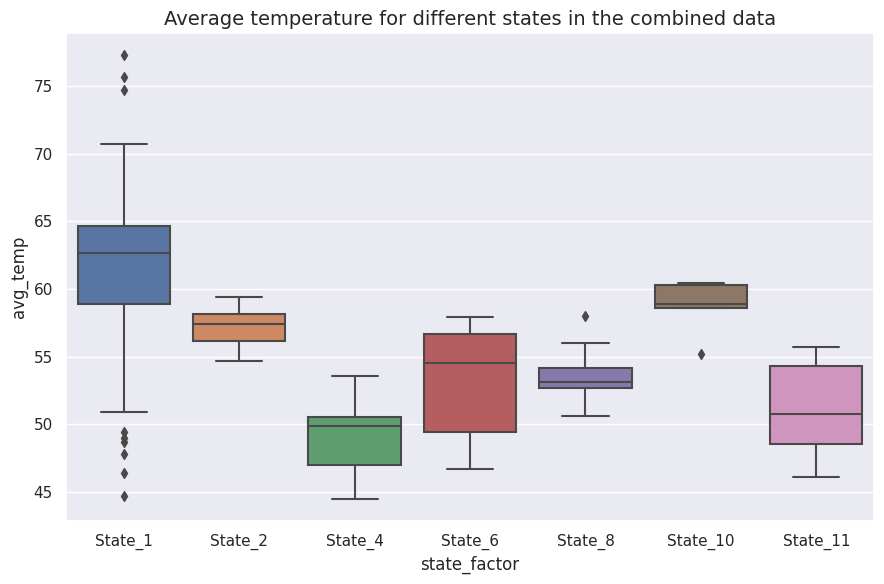

In [42]:
# Average temperature for different states in the combined data
plt.figure(figsize = (9, 6))
sns.boxplot(data = data[['avg_temp', 'state_factor']].drop_duplicates(), y = 'avg_temp', x = 'state_factor')
plt.title("Average temperature for different states in the combined data", fontsize = 14)
plt.tight_layout()
plt.show()

**Observations:**

- `State_1` has the highest average temperature and `State_4` has the lowest average temperature
- `State_6`, `State_11`, `State_1` and `State_4` have greater dispersion than `State_2`, `State_8` and `State_10`

### Correlation structure among numerical features

<Axes: >

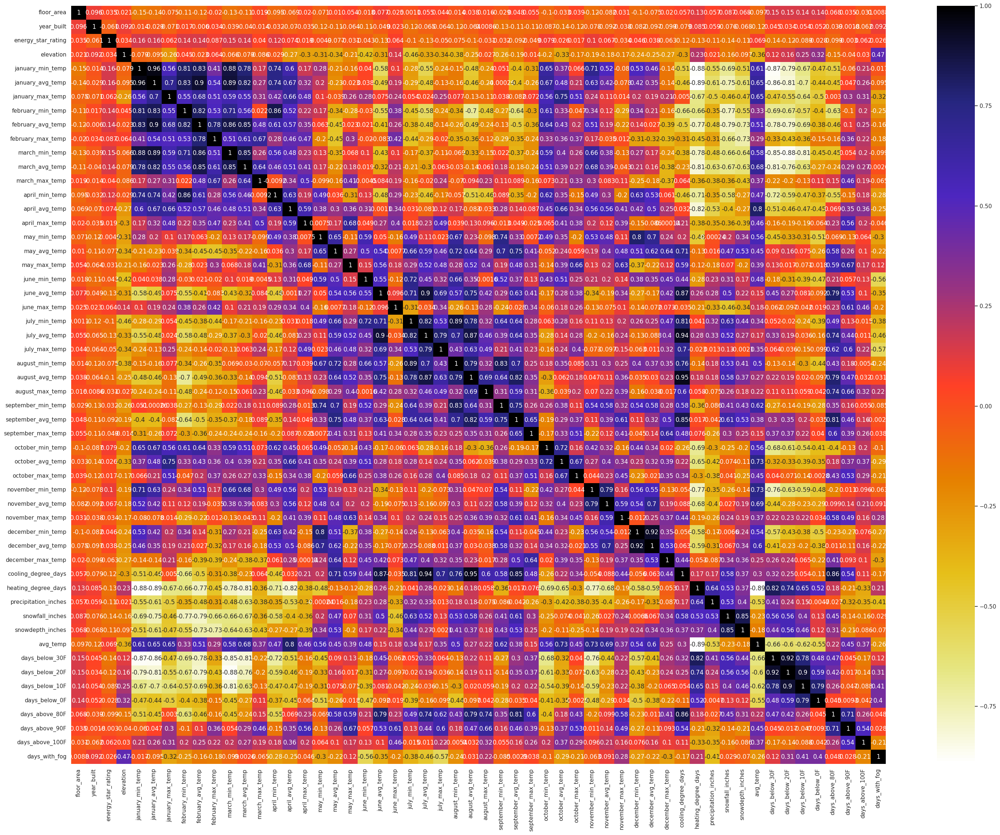

In [43]:
# Heatmap
excluded_cols = object_cols + almost_constant_cols + unrealistic_value_cols + ['year_factor', 'building_id', 'dataset', 'site_eui']
selected_cols = [col for col in data.columns if col not in excluded_cols]
plt.figure(figsize = (36, 27))
sns.heatmap(data[selected_cols].corr(), annot = True, cmap = plt.cm.CMRmap_r)

In [44]:
# Detecting pairs with extreme correlation
def pairs_with_strong_corr(df, cols, threshold = 0.8, show = True, return_variables = False):
    variable_list = []
    corr_positive_list = []
    corr_negative_list = []
    for i in range(len(cols)):
        for j in range(len(cols)):
            if i<j:
                corr = df[cols[i]].corr(df[cols[j]])
                if corr > threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_positive_list.append(((cols[i], cols[j]), corr))
                if corr < -threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_negative_list.append(((cols[i], cols[j]), corr))
    if show == True:
        corr_positive = pd.Series(data = [item[1] for item in corr_positive_list], index = [item[0] for item in corr_positive_list])
        corr_negative = pd.Series(data = [item[1] for item in corr_negative_list], index = [item[0] for item in corr_negative_list])
        print("Pairs with strong positive correlation:")
        print(" ")
        print(corr_positive.sort_values(ascending = False).to_string())
        print(" ")
        print("Pairs with strong negative correlation:")
        print(" ")
        print(corr_negative.sort_values(ascending = True).to_string())
    if return_variables == True:
        return variable_list

pairs_with_strong_corr(df = data, cols = selected_cols, threshold = 0.8)

Pairs with strong positive correlation:
 
(january_min_temp, january_avg_temp)         0.961516
(august_avg_temp, cooling_degree_days)       0.946829
(july_avg_temp, cooling_degree_days)         0.935394
(december_min_temp, december_avg_temp)       0.923225
(days_below_30F, days_below_20F)             0.916268
(january_avg_temp, february_avg_temp)        0.904262
(days_below_20F, days_below_10F)             0.901154
(june_avg_temp, july_avg_temp)               0.895590
(january_avg_temp, march_min_temp)           0.893843
(july_min_temp, august_min_temp)             0.887709
(january_min_temp, march_min_temp)           0.878159
(july_avg_temp, august_avg_temp)             0.870580
(june_avg_temp, cooling_degree_days)         0.868493
(february_avg_temp, march_min_temp)          0.863242
(cooling_degree_days, days_above_80F)        0.860629
(february_min_temp, april_min_temp)          0.855173
(september_avg_temp, cooling_degree_days)    0.853354
(february_avg_temp, march_avg_temp)     

In [45]:
corr_cols = pairs_with_strong_corr(df = data, cols = selected_cols, threshold = 0.8, show = False, return_variables = True)
corr_series = pd.Series(corr_cols)
print("Variables involved in the pairs with extreme correlation and respective counts:")
print(" ")
print(corr_series.value_counts().sort_values(ascending = False).to_string())

Variables involved in the pairs with extreme correlation and respective counts:
 
january_avg_temp       8
march_min_temp         7
january_min_temp       6
heating_degree_days    6
days_below_30F         6
cooling_degree_days    6
february_avg_temp      5
march_avg_temp         5
february_min_temp      4
days_below_20F         4
july_avg_temp          4
september_avg_temp     3
august_avg_temp        3
july_min_temp          3
days_above_80F         2
august_min_temp        2
june_avg_temp          2
avg_temp               2
april_avg_temp         2
days_below_10F         2
september_min_temp     1
april_min_temp         1
december_min_temp      1
december_avg_temp      1
snowfall_inches        1
snowdepth_inches       1


**Observations:**

- The heatmap suggests strong level of [multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity) among the numerical features
- There are $32$ pairs of feature with correlation coefficient over $0.8$ and $12$ pairs of feature with correlation coefficient below $-0.8$
- There are $7$ pairs of features with correlation coefficient over $0.9$
- The features `january_avg_temp`, `march_min_temp`, `january_min_temp`, `heating_degree_days`, `days_below_30F` and `cooling_degree_days` are involved in more than $5$ pairs of features with absolute value of correlation coefficient over $0.8$

### 2.4.2. Relationships of the target variable with the predictor variables

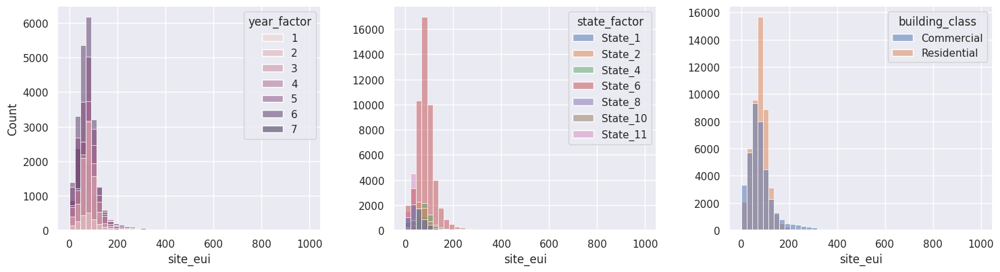

In [46]:
# Site EUI by year_factor, state_factor, building_class
fig, ax = plt.subplots(1, 3, figsize = (15, 4.2), sharey = False)
sns.histplot(data = data_temp, x = 'site_eui', bins = bins_fd, hue = 'year_factor', ax = ax[0])
sns.histplot(data = data_temp, x = 'site_eui', bins = bins_fd, hue = 'state_factor', ax = ax[1])
ax[1].set_ylabel(" ")
sns.histplot(data = data_temp, x = 'site_eui', bins = bins_fd, hue = 'building_class', ax = ax[2])
ax[2].set_ylabel(" ")
plt.tight_layout()
plt.show()

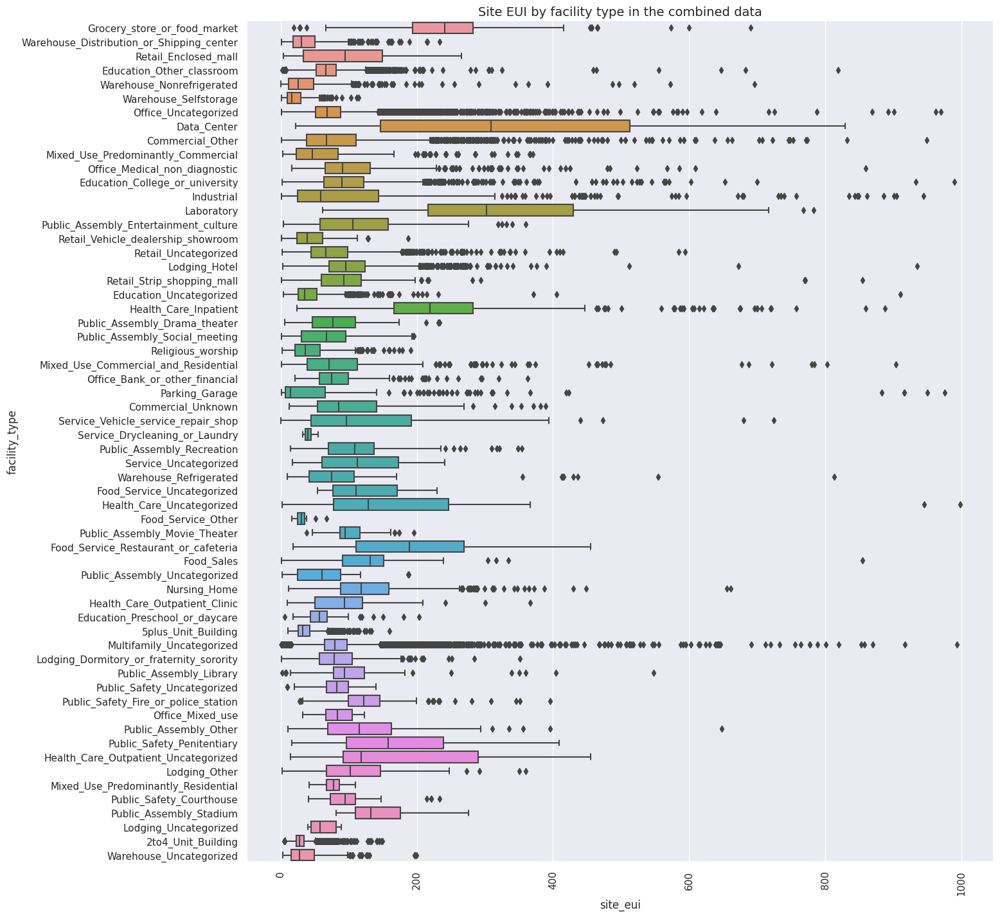

In [47]:
# Site EUI for different facility type in the combined data
fig, ax = plt.subplots(figsize = (15, 17))
ax = sns.boxplot(data = data.drop_duplicates(), x = 'site_eui', y = 'facility_type')
ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
ax.set_title("Site EUI by facility type in the combined data", fontsize = 14)
# plt.tight_layout()
plt.show()

**Observations:**

- `site_eui` for `Grocery_store_or_food_market`, `Data_Center`, `Laboratory`, `Health_Care_Inpatient`, `Health_Care_Uncategorized`, `Health_Care_Outpatient_Uncategorized`, `Food_Service_Restaurant_or_cafeteria`, `Public_Safety_Penitentiary` are relatively larger than the rest of the facility types
- `site_eui` for `Data_Center`, `Laboratory`, `Service_Vehicle_service_repair_shop`, `Health_Care_Uncategorized`, `Health_Care_Outpatient_Uncategorized`, `Food_Service_Restaurant_or_cafeteria` have more dispersion than other facility types

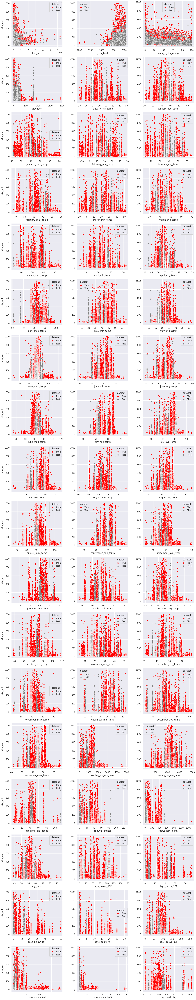

In [48]:
# Site EUI by numerical features
data_temp = data.copy(deep = True)
data_temp['year_built'] = data_temp['year_built'].replace({0: np.nan})
excluded_cols = object_cols + almost_constant_cols + unrealistic_value_cols + ['year_factor', 'building_id', 'dataset', 'site_eui']
selected_cols = [col for col in data.columns if col not in excluded_cols]
fig, ax = plt.subplots(18, 3, figsize = (15, 4.2*18), sharey = False)
for i in range(len(selected_cols)):
    # sns.scatterplot(data = data_temp, x = selected_cols[i], y = 'site_eui', ax = ax[i//3, i%3])
    sns.scatterplot(data = data_temp, x = selected_cols[i], y = 'site_eui', hue = 'dataset', palette = ['red', 'grey'], ax = ax[i//3, i%3])
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

**Observations:**

- Majority of the data points correspond to the lower values of `floor_areas`, `elevation`, `cooling_degree_days`, `snowfall_inches`, `snowdepth_inches`, `days_above_90F`
- Majority of the data points correspond to the higher values of `year_built`
- The weather related numerical columns do not appear to have any strong relationship with `site_eui`

In [49]:
# Correlation between the target variable and the numerical features
excluded_cols = object_cols + almost_constant_cols + unrealistic_value_cols + ['year_factor', 'building_id', 'dataset']
selected_cols = [col for col in data.columns if col not in excluded_cols]
corr_with_target = data[selected_cols].corr()[['site_eui']]
corr_with_target.drop('site_eui', axis = 0, inplace = True)
corr_with_target = corr_with_target.reindex(corr_with_target['site_eui'].abs().sort_values(ascending = False).index)
corr_with_target[corr_with_target['site_eui'].abs() >= 0.1]

,site_eui
energy_star_rating,-0.507136
january_min_temp,-0.186877
january_avg_temp,-0.175913
snowfall_inches,0.165749
february_min_temp,-0.164096
february_avg_temp,-0.161474
days_below_30F,0.150801
march_min_temp,-0.148174
july_avg_temp,0.146639
heating_degree_days,0.142859


**Observations:**

- The target variable `site_eui` has moderately strong negative correlation with `energy_star_rating`
- It has weak positive correlation with `snowfall_inches`, `days_below_30F`, `july_avg_temp`, `heating_degree_days`, `june_avg_temp`, `cooling_degree_days`, `days_below_20F`, `snowdepth_inches`, `august_avg_temp`, `july_min_temp`, `september_avg_temp`, `precipitation_inches`, `days_above_80F`
- It has weak negative correlation with `january_min_temp`, `january_avg_temp`, `february_min_temp`, `february_avg_temp`, `march_min_temp`, `march_avg_temp`, `april_min_temp`, `november_min_temp`
- It does not show any significant linear relationship with `days_below_10F`, `february_max_temp`, `april_avg_temp`, `october_min_temp`, `september_max_temp`, `july_max_temp`, `august_min_temp`, `may_avg_temp`, `january_max_temp`, `floor_area`, `december_max_temp`, `avg_temp`, `december_min_temp`, `november_avg_temp`, `days_below_0F`, `may_max_temp`, `days_with_fog`, `june_min_temp`, `december_avg_temp`, `september_min_temp`, `june_max_temp`, `october_max_temp`, `elevation`, `august_max_temp`, `march_max_temp`, `november_max_temp` and `october_avg_temp`

# 3. Data Preprocessing

- Missing Data Imputation
- Categorical Data Encoding

## 3.1. Missing Data Imputation

In [Basic Data Exploration](#Basic-Data-Exploration), we have seen that:
- The training data contains more than $50\%$ missing values for the features `days_with_fog`, `direction_peak_wind_speed`, `direction_max_wind_speed` and `max_wind_speed`
- The test data contains more than $88\%$ missing values for the same features

Hence we drop these features.

In [50]:
# Dropping features with extensive amount of missing values
data_train.drop(['days_with_fog', 'direction_peak_wind_speed', 'direction_max_wind_speed', 'max_wind_speed'], axis = 1, inplace = True)
data_test.drop(['days_with_fog', 'direction_peak_wind_speed', 'direction_max_wind_speed', 'max_wind_speed'], axis = 1, inplace = True)

- The feature `energy_star_rating` has $35.25\%$ missing values in the training data and $23.22\%$ missing values in the test data
- The feature `year_built` has $2.42\%$ missing values in the training data and $0.94\%$ missing values in the test data

We impute the missing values not only for `year_built`, which has a minimal amount of missing values, but also for `energy_star_rating`, considering the fact that it has the highest correlation (in absolute value) with the target variable.

In [51]:
# Columns with missing values (sorted by count of missing values) in the training data
print("Training data")
print("-------------")
print(data_train.isna().sum()[data_train.isna().sum() != 0].sort_values(ascending = False).to_string())

Training data
-------------
energy_star_rating    26709
year_built             1837


In [52]:
# Number of rows with missing values in the training data
print("Training data")
print("-------------")
print(pd.Series({"Number of rows with one feature missing": len(data_train.T.isna().sum()[data_train.T.isna().sum() == 1]),
                 "Number of rows with both features missing": len(data_train.T.isna().sum()[data_train.T.isna().sum() == 2]),
                 "-----------------------------------------": "-----",
                 "Total number of rows with missing values": len(data_train.T.isna().sum()[data_train.T.isna().sum() != 0])}).to_string())

Training data
-------------
Number of rows with one feature missing      26078
Number of rows with both features missing     1234
-----------------------------------------    -----
Total number of rows with missing values     27312


In [53]:
# Columns with missing values (sorted by count of missing values) in the test data
print("Test data")
print("---------")
print(data_test.isna().sum()[data_test.isna().sum() != 0].sort_values(ascending = False).to_string())

Test data
---------
energy_star_rating    2254
year_built              92


In [54]:
# Number of rows with missing values in the test data
print("Test data")
print("---------")
print(pd.Series({"Number of rows with one feature missing": len(data_test.T.isna().sum()[data_test.T.isna().sum() == 1]),
                 "Number of rows with both features missing": len(data_test.T.isna().sum()[data_test.T.isna().sum() == 2]),
                 "-----------------------------------------": "-----",
                 "Total number of rows with missing values": len(data_test.T.isna().sum()[data_test.T.isna().sum() != 0])}).to_string())

Test data
---------
Number of rows with one feature missing       2262
Number of rows with both features missing       42
-----------------------------------------    -----
Total number of rows with missing values      2304


Both `energy_star_rating` and `year_built` are numerical features. We opt for `median imputation` to negate the effect of possible outliers.

In [55]:
# Imputation in the training data
esr_train_median = data_train['energy_star_rating'].median()
year_built_train_median = data_train['year_built'].median()
data_train['energy_star_rating'] = data_train['energy_star_rating'].fillna(esr_train_median)
data_train['year_built'] = data_train['year_built'].fillna(year_built_train_median)

We impute the missing values of `energy_star_rating` and `year_built` in the test data by the medians of the respective features in the training data (not the test data), following the suggestion of [Aurélien Géron](https://www.oreilly.com/pub/au/7106) in his book [Hands-On Machine Learning with Scikit-Learn and TensorFlow](https://www.oreilly.com/library/view/hands-on-machine-learning/9781491962282/) (page $60$, chapter $2$):

> *...  you should compute the median value on the training set, and use it to fill the missing values in the training set, but also don’t forget to save the median value that you have computed. You will need it later to replace missing values in the test set when you want to evaluate your system, and also once the system goes live to replace missing values in new data.*

In [56]:
data_test['energy_star_rating'] = data_test['energy_star_rating'].fillna(esr_train_median)
data_test['year_built'] = data_test['year_built'].fillna(year_built_train_median)

In [57]:
print("After imputation:")
print("-----------------")
print(pd.Series({"Total number of missing values in the training data": data_train.isna().sum().sum(),
                 "Total number of missing values in the test data": data_test.isna().sum().sum()}).to_string())

After imputation:
-----------------
Total number of missing values in the training data    0
Total number of missing values in the test data        0


## 3.2. Categorical Data Encoding

In [58]:
object_cols_encoded = ['state_factor_encoded', 'building_class_encoded', 'facility_type_encoded']

We employ [Target Encoder](https://contrib.scikit-learn.org/category_encoders/targetencoder.html) to numerically encode the categorical features `state_factor`, `building_class` and `facility_type`. In the present situation, the target variable (`site_eui`) is a continuous variable. According to [this](https://contrib.scikit-learn.org/category_encoders/targetencoder.html) documentation on *target encoder*:

> *For the case of continuous target: features are replaced with a blend of the expected value of the target given particular categorical value and the expected value of the target over all the training data.*

In [59]:
# Target encoding of categorical features in the training data
for col in object_cols:
    encoder = TargetEncoder()
    data_train[f'{col}_encoded'] = encoder.fit_transform(data_train[col], data_train['site_eui'])

The mapping of the original values and the corresponding encoded values for each categorical feature in the training data are recorded in form of dictionaries, to be applied on the test data later.

In [60]:
# Constructing dictionaries connecting original values and encoded values
state_factor_enc_dict = {}
building_class_enc_dict = {}
facility_type_enc_dict = {}

# state_factor
for i in range(len(data_train['state_factor'].unique())):
    state_factor_enc_dict[data_train['state_factor'].unique().tolist()[i]] = data_train['state_factor_encoded'].unique().tolist()[i]

# building_class
for i in range(len(data_train['building_class'].unique())):
    building_class_enc_dict[data_train['building_class'].unique().tolist()[i]] = data_train['building_class_encoded'].unique().tolist()[i]

# facility_type
for i in range(len(data_train['facility_type'].unique())):
    facility_type_enc_dict[data_train['facility_type'].unique().tolist()[i]] = data_train['facility_type_encoded'].unique().tolist()[i]

Having encoded the original categorical columns, we drop them from the dataset.

In [61]:
# Dropping original columns of the categorical features in the training data
for col in object_cols:
    data_train.drop(col, axis = 1, inplace = True)

Now we encode the categorical columns in the test data, using dictionaries containing the exact encoding scheme (the map connecting original values and encoded values) of the same columns in the training data.

In [62]:
# Target encoding of categorical features in the test data
data_test['state_factor_encoded'] = data_test['state_factor'].map(state_factor_enc_dict)
data_test['building_class_encoded'] = data_test['building_class'].map(building_class_enc_dict)
data_test['facility_type_encoded'] = data_test['facility_type'].map(facility_type_enc_dict)

In [63]:
# Dropping original columns of the categorical features in the test data
for col in object_cols:
    data_test.drop(col, axis = 1, inplace = True)

# 4. Feature Engineering

- Extraction of new features
- Exploratory data analysis of the new features
- Transformation
- Binarization

## 4.1. Extraction of new features

In [64]:
# Extracting weather statistics in the training data
temp_all = [col for col in data_train.columns if "temp" in col]
temp_winter = [col for col in temp_all if ('january' in col or 'february' in col or 'december' in col)]
temp_spring = [col for col in temp_all if ('march' in col or 'april' in col or 'may' in col)]
temp_summer = [col for col in temp_all if ('june' in col or 'july' in col or 'august' in col)]
temp_autumn = [col for col in temp_all if ('september' in col or 'october' in col or 'november' in col)]

data_train['min_temp_winter'] = data_train[temp_winter].min(axis = 1)
data_train['max_temp_winter'] = data_train[temp_winter].max(axis = 1)
data_train['avg_temp_winter'] = data_train[temp_winter].mean(axis = 1)
data_train['std_temp_winter'] = data_train[temp_winter].std(axis = 1)
data_train['skew_temp_winter'] = data_train[temp_winter].skew(axis = 1)

data_train['min_temp_spring'] = data_train[temp_spring].min(axis = 1)
data_train['max_temp_spring'] = data_train[temp_spring].max(axis = 1)
data_train['avg_temp_spring'] = data_train[temp_spring].mean(axis = 1)
data_train['std_temp_spring'] = data_train[temp_spring].std(axis = 1)
data_train['skew_temp_spring'] = data_train[temp_spring].skew(axis = 1)

data_train['min_temp_summer'] = data_train[temp_summer].min(axis = 1)
data_train['max_temp_summer'] = data_train[temp_summer].max(axis = 1)
data_train['avg_temp_summer'] = data_train[temp_summer].mean(axis = 1)
data_train['std_temp_summer'] = data_train[temp_summer].max(axis = 1)
data_train['skew_temp_summer'] = data_train[temp_summer].max(axis = 1)

data_train['min_temp_autumn'] = data_train[temp_autumn].min(axis = 1)
data_train['max_temp_autumn'] = data_train[temp_autumn].max(axis = 1)
data_train['avg_temp_autumn'] = data_train[temp_autumn].mean(axis = 1)
data_train['std_temp_autumn'] = data_train[temp_autumn].std(axis = 1)
data_train['skew_temp_autumn'] = data_train[temp_autumn].skew(axis = 1)

data_train['cooling_degree_days_per_month'] = data_train['cooling_degree_days'] / 12
data_train['heating_degree_days_per_month'] = data_train['heating_degree_days'] / 12

In [65]:
# Extracting weather statistics in the test data
data_test['min_temp_winter'] = data_test[temp_winter].min(axis = 1)
data_test['max_temp_winter'] = data_test[temp_winter].max(axis = 1)
data_test['avg_temp_winter'] = data_test[temp_winter].mean(axis = 1)
data_test['std_temp_winter'] = data_test[temp_winter].std(axis = 1)
data_test['skew_temp_winter'] = data_test[temp_winter].skew(axis = 1)

data_test['min_temp_spring'] = data_test[temp_spring].min(axis = 1)
data_test['max_temp_spring'] = data_test[temp_spring].max(axis = 1)
data_test['avg_temp_spring'] = data_test[temp_spring].mean(axis = 1)
data_test['std_temp_spring'] = data_test[temp_spring].std(axis = 1)
data_test['skew_temp_spring'] = data_test[temp_spring].skew(axis = 1)

data_test['min_temp_summer'] = data_test[temp_summer].min(axis = 1)
data_test['max_temp_summer'] = data_test[temp_summer].max(axis = 1)
data_test['avg_temp_summer'] = data_test[temp_summer].mean(axis = 1)
data_test['std_temp_summer'] = data_test[temp_summer].max(axis = 1)
data_test['skew_temp_summer'] = data_test[temp_summer].max(axis = 1)

data_test['min_temp_autumn'] = data_test[temp_autumn].min(axis = 1)
data_test['max_temp_autumn'] = data_test[temp_autumn].max(axis = 1)
data_test['avg_temp_autumn'] = data_test[temp_autumn].mean(axis = 1)
data_test['std_temp_autumn'] = data_test[temp_autumn].std(axis = 1)
data_test['skew_temp_autumn'] = data_test[temp_autumn].skew(axis = 1)

data_test['cooling_degree_days_per_month'] = data_test['cooling_degree_days'] / 12
data_test['heating_degree_days_per_month'] = data_test['heating_degree_days'] / 12

In [66]:
# Number of old and new weather related features
features_drop = temp_all + ['cooling_degree_days', 'heating_degree_days']
features_new = [col for col in data_train.columns if "temp_" in col] + ['cooling_degree_days_per_month', 'heating_degree_days_per_month']
print(pd.Series({"Number of old weather related features to be dropped": len(features_drop),
                 "Number of new weather related features": len(features_new)}).to_string())

Number of old weather related features to be dropped    39
Number of new weather related features                  22


In [67]:
# Dropping old weather related features
data_train.drop(features_drop, axis = 1, inplace = True)
data_test.drop(features_drop, axis = 1, inplace = True)

## 4.2. Exploratory data analysis of the new features

**Understanding the new features**

We convert the month-based temperature related features to season-based features by partitioning the full year into four seasons: **winter** (December, January, February), **spring** (March, April, May), **summer** (June, July, August) and **spring** (September, October, November).

- **min_temp_winter:** minimum temperature in winter (in Fahrenheit) at the location of the building

- **max_temp_winter:** maximum temperature in winter (in Fahrenheit) at the location of the building

- **avg_temp_winter:** average temperature in winter (in Fahrenheit) at the location of the building

- **std_temp_winter:** standard deviation of temperature in winter (in Fahrenheit) at the location of the building

- **skew_temp_winter:** skewness of temperature in winter (in Fahrenheit) at the location of the building

*Similarly for spring, summer and autumn*

- **cooling_degree_days_per_month:** average number of degrees where the daily average temperature exceeds 65 degrees Fahrenheit in a month

- **heating_degree_days_per_month:** average number of degrees where the daily average temperature falls under 65 degrees Fahrenheit in a month

In [68]:
# New column names (same for the training data and the test data)
data_train[features_new].columns

Index(['min_temp_winter', 'max_temp_winter', 'avg_temp_winter',
       'std_temp_winter', 'skew_temp_winter', 'min_temp_spring',
       'max_temp_spring', 'avg_temp_spring', 'std_temp_spring',
       'skew_temp_spring', 'min_temp_summer', 'max_temp_summer',
       'avg_temp_summer', 'std_temp_summer', 'skew_temp_summer',
       'min_temp_autumn', 'max_temp_autumn', 'avg_temp_autumn',
       'std_temp_autumn', 'skew_temp_autumn', 'cooling_degree_days_per_month',
       'heating_degree_days_per_month'],
      dtype='object')

In [69]:
# New column datatypes (same for the training data and the test data)
print(data_train[features_new].dtypes.to_string())

min_temp_winter                  float64
max_temp_winter                  float64
avg_temp_winter                  float64
std_temp_winter                  float64
skew_temp_winter                 float64
min_temp_spring                  float64
max_temp_spring                  float64
avg_temp_spring                  float64
std_temp_spring                  float64
skew_temp_spring                 float64
min_temp_summer                  float64
max_temp_summer                  float64
avg_temp_summer                  float64
std_temp_summer                  float64
skew_temp_summer                 float64
min_temp_autumn                  float64
max_temp_autumn                  float64
avg_temp_autumn                  float64
std_temp_autumn                  float64
skew_temp_autumn                 float64
cooling_degree_days_per_month    float64
heating_degree_days_per_month    float64


In [70]:
# Statistical description of the new features in the training data
data_train[features_new].describe()

,min_temp_winter,max_temp_winter,avg_temp_winter,std_temp_winter,skew_temp_winter,min_temp_spring,max_temp_spring,avg_temp_spring,std_temp_spring,skew_temp_spring,...,avg_temp_summer,std_temp_summer,skew_temp_summer,min_temp_autumn,max_temp_autumn,avg_temp_autumn,std_temp_autumn,skew_temp_autumn,cooling_degree_days_per_month,heating_degree_days_per_month
count,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,...,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000
mean,7.675674,66.506857,37.710072,20.844240,-0.009879,21.530974,89.047481,55.877106,23.040444,0.033085,...,74.749695,96.065763,96.065763,28.518988,92.354990,59.843325,20.819329,0.049277,100.187537,360.413116
std,10.872772,4.920021,5.699243,3.240693,0.186045,9.991566,2.854624,3.329247,2.448144,0.310168,...,2.738374,3.685051,3.685051,7.030513,4.937551,2.750654,2.677493,0.170673,32.630148,68.697227
min,-19.000000,50.000000,18.140681,12.779553,-0.348970,-9.000000,66.000000,41.507037,12.020507,-0.637959,...,56.067085,67.000000,67.000000,4.000000,73.000000,47.210624,12.751403,-0.465384,0.000000,33.166667
25%,2.000000,62.000000,35.277469,18.727631,-0.090643,13.000000,88.000000,53.651434,21.471823,-0.272090,...,74.415412,95.000000,95.000000,23.000000,91.000000,58.635006,19.428601,-0.050379,94.000000,331.500000
50%,4.000000,65.000000,35.508385,21.536260,0.005259,25.000000,89.000000,55.170498,23.324683,0.051282,...,76.048327,96.000000,96.000000,31.000000,92.000000,59.478913,20.984169,0.086495,106.416667,361.416667
75%,13.000000,71.000000,40.741070,22.613829,0.083319,27.000000,91.000000,56.999403,24.089935,0.112829,...,76.233871,98.000000,98.000000,34.000000,96.000000,61.591637,23.149084,0.108344,124.083333,389.166667
max,44.000000,91.000000,63.730351,28.642124,0.355819,52.000000,112.000000,75.152330,29.768353,0.967633,...,91.930287,119.000000,119.000000,52.000000,111.000000,79.100956,29.673618,0.606984,412.333333,660.750000


In [71]:
# Statistical description of the new features in the test data
data_test[features_new].describe()

,min_temp_winter,max_temp_winter,avg_temp_winter,std_temp_winter,skew_temp_winter,min_temp_spring,max_temp_spring,avg_temp_spring,std_temp_spring,skew_temp_spring,...,avg_temp_summer,std_temp_summer,skew_temp_summer,min_temp_autumn,max_temp_autumn,avg_temp_autumn,std_temp_autumn,skew_temp_autumn,cooling_degree_days_per_month,heating_degree_days_per_month
count,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,...,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000
mean,11.642246,66.940958,38.992544,20.304129,0.042299,23.146419,87.359093,54.494031,21.750269,0.279212,...,70.501574,94.239155,94.239155,25.163627,93.104894,57.464361,21.929580,0.243926,61.113490,380.433505
std,14.785293,6.397885,6.314206,6.772783,0.065490,11.553421,4.449191,3.679272,5.510740,0.283092,...,2.856828,2.216951,2.216951,8.502825,4.247122,3.935443,2.889062,0.338003,37.680676,97.128320
min,-8.000000,52.000000,31.280146,11.532379,-0.034349,8.000000,80.000000,46.233931,15.503298,-0.110039,...,63.777500,91.000000,91.000000,16.000000,88.000000,50.677419,18.626657,-0.344844,9.166667,176.000000
25%,-8.000000,59.000000,31.280146,13.378875,-0.007697,12.000000,82.000000,51.756528,15.503298,0.056475,...,68.593489,93.000000,93.000000,16.000000,90.000000,54.144026,18.626657,-0.095805,28.750000,296.250000
50%,15.000000,69.000000,40.646505,23.339768,0.032583,21.000000,88.000000,52.827360,25.723007,0.061014,...,69.976822,94.000000,94.000000,25.000000,91.000000,55.962306,22.271759,0.197854,63.416667,373.166667
75%,21.000000,73.000000,43.101221,28.303177,0.107184,33.000000,92.000000,59.758781,26.853999,0.636895,...,69.992399,97.000000,97.000000,30.000000,95.000000,61.112302,25.398108,0.443089,72.166667,492.250000
max,38.000000,76.000000,52.107335,28.303177,0.252672,42.000000,94.000000,61.587634,27.390463,0.895145,...,76.759857,98.000000,98.000000,43.000000,104.000000,66.778913,25.398108,1.072368,136.916667,573.083333


In [72]:
# Combining the data
data_train_temp = data_train.copy(deep = True)
data_train_temp['dataset'] = "Train"
data_test_temp = data_test.copy(deep = True)
data_test_temp['dataset'] = "Test"
data = pd.concat([data_train_temp, data_test_temp], axis = 0, ignore_index = True)

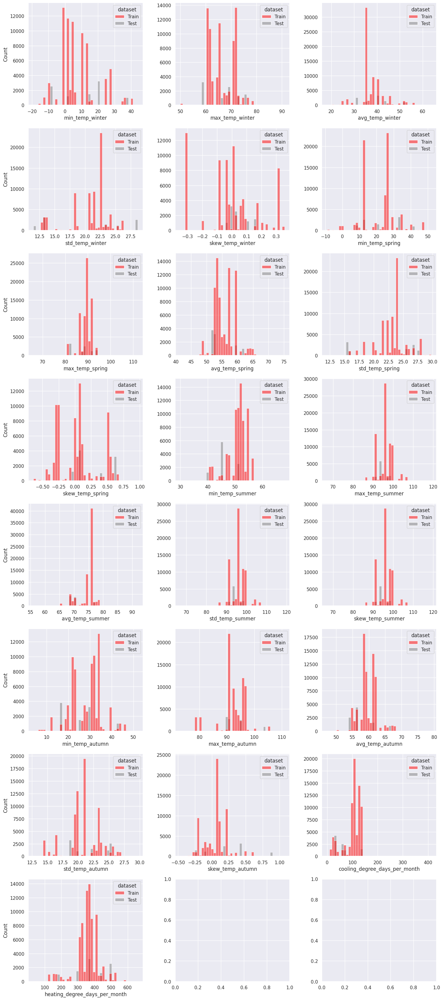

In [73]:
# Distributions of the new features
data_temp = data.copy(deep = True)
fig, ax = plt.subplots(8, 3, figsize = (15, 4.2*8), sharey = False)
for i in range(len(features_new)):
    sns.histplot(data = data_temp, x = features_new[i], bins = bins_fd, hue = 'dataset', palette = ['red', 'grey'], ax = ax[i//3, i%3])
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

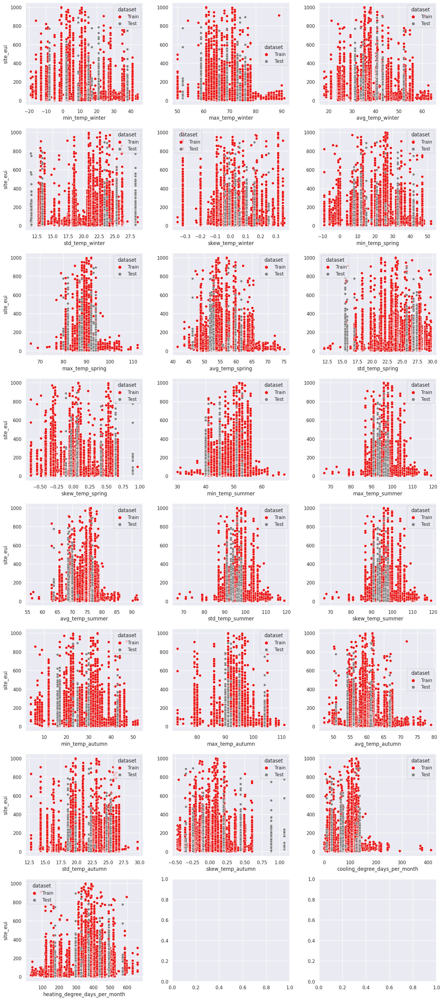

In [74]:
# Relationship of Site EUI with the new features
data_temp = data.copy(deep = True)
fig, ax = plt.subplots(8, 3, figsize = (15, 4.2*8), sharey = False)
for i in range(len(features_new)):
    # sns.scatterplot(data = data_temp, x = features_new[i], y = 'site_eui', ax = ax[i//3, i%3])
    sns.scatterplot(data = data_temp, x = features_new[i], y = 'site_eui', hue = 'dataset', palette = ['red', 'grey'], ax = ax[i//3, i%3])
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

## 4.3. Transformation

We apply location change $x \mapsto x - min(x)+1$ on the features `floor_area` and `elevation` to make their range start from $1$. The relocated variables fall inside the range $[1, \infty)$. Now we apply the log transformation $y \mapsto \log{y}$. The relocation preceding the log transformation ensures that there are no negative values to be fed to the $\log$ function. The addition of $1$ ensures that there are no values very close to $0$, which the log transformation maps to extreme negative values.

In [75]:
# Transformation
skewed_cols = ['floor_area', 'elevation']
skewed_cols_log = []
for col in skewed_cols:
    min_ = data_train[col].min()
    data_train[col] = data_train[col].apply(lambda x: x - min_ + 1)
    data_train[f"{col}_log"] = data_train[col].apply(np.log)
    data_train.drop(col, axis = 1, inplace = True)
    data_test[col] = data_test[col].apply(lambda x: x - min_ + 1)
    data_test[f"{col}_log"] = data_test[col].apply(np.log)
    data_test.drop(col, axis = 1, inplace = True)
    skewed_cols_log.append(f"{col}_log")

## 4.4. Binarization

We have observed in the [univariate analysis](#Univariate-Analysis) that the features `days_above_100F` and `days_above_110F` are $0$ for most observations in both the training data and the test data. So we binarize the two features, keeping the zero values as $0$ and mapping the non-zero values to $1$.

In [76]:
# Binarization
zero_cols = ['days_above_100F', 'days_above_110F']
zero_cols_binary = []
for col in zero_cols:
    data_train[f"{col}_binary"] = np.where(data_train[col] == 0, 0, 1)
    data_train.drop(col, axis = 1, inplace = True)
    data_test[f"{col}_binary"] = np.where(data_test[col] == 0, 0, 1)
    data_test.drop(col, axis = 1, inplace = True)
    zero_cols_binary.append(f"{col}_binary")

# 5. Baseline Modeling

- Random Forest
- XGBoost
- CatBoost
- Model Comparison

In [77]:
# Typecasting numerical features
for col in data_train.columns:
    if col not in object_cols_encoded + zero_cols_binary:
        data_train[col] = data_train[col].astype('float64')
        data_test[col] = data_test[col].astype('float64')

In [78]:
# Predictor-target split
X_train = data_train.drop(['building_id', 'site_eui'], axis = 1)
y_train = data_train['site_eui']
X_test = data_test.drop(['building_id', 'site_eui'], axis = 1)
y_test = data_test['site_eui']

In [79]:
# Function to compute evaluation metrics
def eval_df_cv(model, X_train, y_train, X_test, y_test, train = True, cv = True, cv_fold = 6, test = True):

    # Performance on the training set
    if train == True:
        y_train_pred = model.predict(X_train)
        eval_dict_train = pd.Series({'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
                                     'MAE': mean_absolute_error(y_train, y_train_pred),
                                     'R2': r2_score(y_train, y_train_pred)})

    # Performance on the test set
    if test == True:
        y_test_pred = model.predict(X_test)
        eval_dict_test = pd.Series({'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
                                    'MAE': mean_absolute_error(y_test, y_test_pred),
                                    'R2': r2_score(y_test, y_test_pred)})

    # K-fold cross validation
    if cv == True:
        kfolds = KFold(n_splits = cv_fold, shuffle = True, random_state = 0)
        scoring_dict = {'RMSE': 'neg_root_mean_squared_error',
                        'MAE': 'neg_mean_absolute_error',
                        'R2': 'r2'}
        cv_score = cross_validate(model, X_train, y_train, cv = kfolds, scoring = scoring_dict)
        eval_dict_cv_mean = pd.Series({'RMSE': -cv_score['test_RMSE'].mean(),
                                       'MAE': -cv_score['test_MAE'].mean(),
                                       'R2': cv_score['test_R2'].mean()})
        eval_dict_cv_std = pd.Series({'RMSE': cv_score['test_RMSE'].std(),
                                      'MAE': cv_score['test_MAE'].std(),
                                      'R2': cv_score['test_R2'].std()})

    # Summary dataframe
    eval_dict_train_df = pd.DataFrame(eval_dict_train.items(), columns = ['Metric', 'Train'])
    eval_dict_test_df = pd.DataFrame(eval_dict_test.items(), columns = ['Metric', 'Test'])
    eval_dict_cv_mean_df = pd.DataFrame(eval_dict_cv_mean.items(), columns = ['Metric', 'CV_mean'])
    eval_dict_cv_std_df = pd.DataFrame(eval_dict_cv_std.items(), columns = ['Metric', 'CV_sd'])
    eval_dict_train_df.set_index('Metric', inplace = True)
    eval_dict_test_df.set_index('Metric', inplace = True)
    eval_dict_cv_mean_df.set_index('Metric', inplace = True)
    eval_dict_cv_std_df.set_index('Metric', inplace = True)
    eval_dict_df = pd.concat([eval_dict_train_df, eval_dict_test_df, eval_dict_cv_mean_df, eval_dict_cv_std_df], axis = 1, sort = False).reset_index()
    eval_dict_df.rename(columns = {'index': 'Metric'})
    return eval_dict_df

## 5.1. Random Forest

In [80]:
# Random Forest
rf = RandomForestRegressor(random_state = 0)
rf.fit(X_train, y_train)
eval_df_cv_rf = eval_df_cv(rf, X_train, y_train, X_test, y_test, cv_fold = 6)

In [81]:
# Summary dataframe
eval_df_cv_rf

,Metric,Train,Test,CV_mean,CV_sd
0,RMSE,14.528213,28.179545,39.914511,0.649366
1,MAE,7.284949,15.506629,20.098618,0.254542
2,R2,0.937805,0.780377,0.530294,0.012821


## 5.2. XGBoost

In [82]:
# XGBoost
xgb = XGBRegressor(random_state = 0)
xgb.fit(X_train, y_train)
eval_df_cv_xgb = eval_df_cv(xgb, X_train, y_train, X_test, y_test, cv_fold = 6)

In [83]:
# Summary dataframe
eval_df_cv_xgb

,Metric,Train,Test,CV_mean,CV_sd
0,RMSE,33.492470,41.183607,40.857126,0.411294
1,MAE,18.646603,26.630152,20.988162,0.229425
2,R2,0.669457,0.530907,0.507760,0.013521


## 5.3. CatBoost

In [84]:
# CatBoost
cat_feautres_idx = np.where(X_train.dtypes != 'float64')[0]
catb = CatBoostRegressor(iterations = 1000,
                         learning_rate = 0.02,
                         depth = 12,
                         eval_metric = 'RMSE',
                         # early_stopping_rounds = 42,
                         random_state = 0,
                         bagging_temperature = 0.2,
                         od_type = 'Iter',
                         metric_period = 100,
                         od_wait = 100)
catb.fit(X_train, y_train,
         eval_set = (X_test, y_test),
         cat_features = cat_feautres_idx,
         use_best_model = True,
         verbose = False)

eval_df_cv_catb = eval_df_cv(catb, X_train, y_train, X_test, y_test, cv_fold = 6)

In [85]:
# Summary dataframe
eval_df_cv_catb

,Metric,Train,Test,CV_mean,CV_sd
0,RMSE,35.389342,35.595565,41.552393,0.619751
1,MAE,19.301683,20.456707,21.127464,0.213137
2,R2,0.630956,0.649569,0.490991,0.011497


## 5.4. Model Comparison

In [86]:
# Combining the metric scores for all models considered
eval_df_cv_rf.insert(loc = 0, column = 'Regressor', value = 'Random Forest')
eval_df_cv_xgb.insert(loc = 0, column = 'Regressor', value = 'XGBoost')
eval_df_cv_catb.insert(loc = 0, column = 'Regressor', value = 'CatBoost')
eval_df_cv_all = pd.concat([eval_df_cv_rf, eval_df_cv_xgb, eval_df_cv_catb], axis = 0)

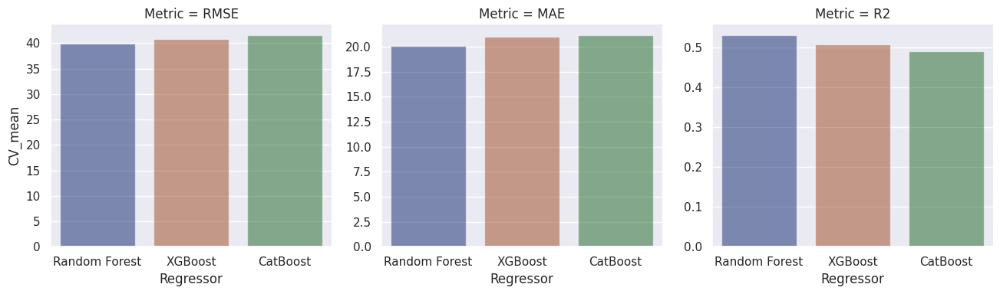

In [87]:
# Comparison of models based on cross-validation scores
sns.catplot(data = eval_df_cv_all,
            kind = "bar",
            col = "Metric",
            y = "CV_mean",
            x = "Regressor",
            sharey = False,
            # col_wrap = 3,
            ci = "sd",
            palette = "dark",
            alpha = 0.5,
            height = 4,
            aspect = 1.1)
plt.tight_layout()
plt.show()

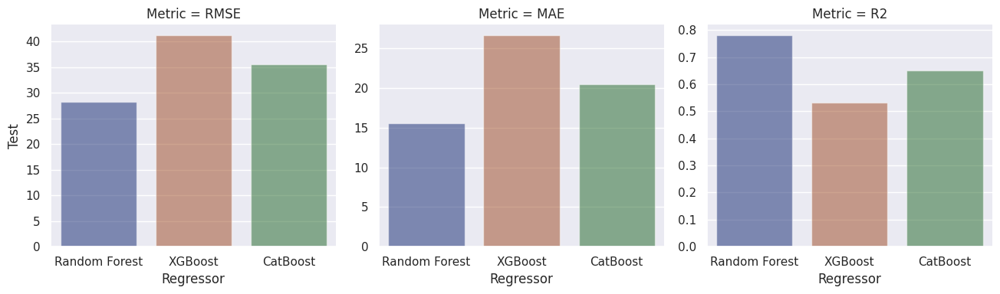

In [88]:
# Comparison of models based on test scores
sns.catplot(data = eval_df_cv_all,
            kind = "bar",
            col = "Metric",
            y = "Test",
            x = "Regressor",
            sharey = False,
            # col_wrap = 3,
            ci = "sd",
            palette = "dark",
            alpha = 0.5,
            height = 4,
            aspect = 1.1)
plt.tight_layout()
plt.show()

**Observation:** Based on all three evaluation metrics, both the cross validation scores and the test scores suggest that Random Forest regressor is working the best, followed by CatBoost regressor and then XGBoost regressor.

# 6. Hyperparameter Tuning

In [89]:
# Objective function
def objective_rf(trial, data = X_train, target = y_train):
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "max_depth": trial.suggest_int("max_depth", 5, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "max_features": trial.suggest_float("max_features", 0.01, 0.95),
        "random_state": 0
    }

    model = RandomForestRegressor(**param)
    kfolds = KFold(n_splits = 6, shuffle = True, random_state = 0)
    scores = cross_val_score(model, data, target, cv = kfolds, scoring = "neg_root_mean_squared_error")
    return -scores.mean()

In [90]:
# Tuning function
def tuner(objective, n = 10, direction = 'minimize'):

    # Create Study object
    sampler = optuna.samplers.TPESampler(seed = 0)
    study = optuna.create_study(direction = direction, sampler = sampler)

    # Optimize the study
    study.optimize(objective, n_trials = n)
    display(optuna.visualization.plot_optimization_history(study))

    # Print the result
    best_params = study.best_params
    best_score = study.best_value
    print(f"Best RMSE score: {best_score}")
    print(f"Optimized parameters: {best_params}\n")
    print("-------- Tuning complete --------")

    # Return best parameters for the model
    return best_params, best_score

In [91]:
# Tuning the parameters and plotting optimization history
rf_param, rf_score = tuner(objective_rf, n = 10, direction = 'minimize')
rf_tuned = RandomForestRegressor(**rf_param)
rf_tuned.fit(X_train, y_train)
eval_df_rf_tuned = eval_df_cv(rf_tuned, X_train, y_train, X_test, y_test)
display(eval_df_rf_tuned)

Best RMSE score: 40.76934266775879
Optimized parameters: {'n_estimators': 492, 'max_depth': 17, 'min_samples_split': 6, 'max_features': 0.7436974257092681}

-------- Tuning complete --------


,Metric,Train,Test,CV_mean,CV_sd
0,RMSE,31.385212,32.742930,40.793801,0.734567
1,MAE,16.819598,17.944242,20.564696,0.220290
2,R2,0.709742,0.703486,0.509338,0.015565


In [92]:
# Function to plot error distribution
def plot_error_dist(y_test, y_pred, figsize = (9, 6)):
    plt.figure(figsize = figsize)
    sns.distplot(y_test - y_pred)
    plt.title("Error distribution")
    plt.xlabel("error")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

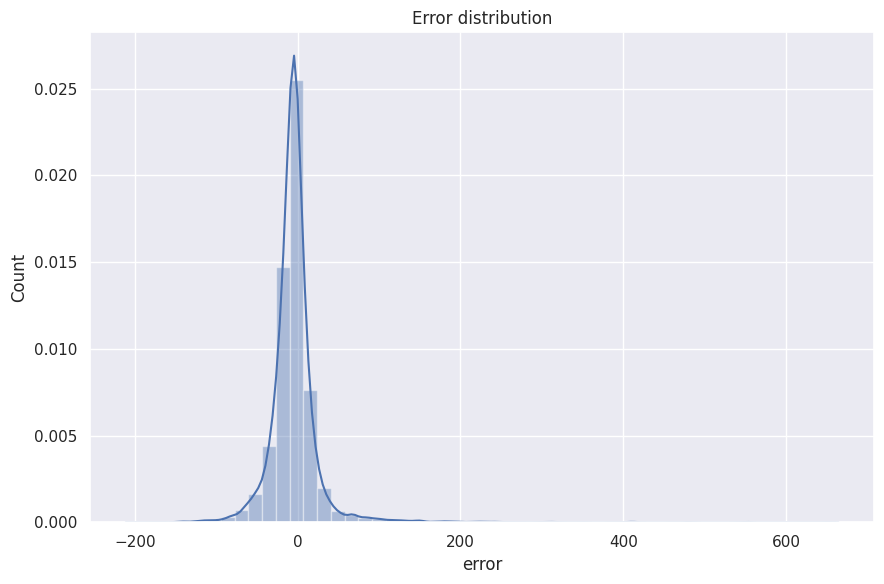

In [93]:
# Error distribution
y_pred = rf_tuned.predict(X_test)
plot_error_dist(y_test, y_pred)

# Acknowledgements

- [WiDS Datathon 2022 Dataset](https://www.kaggle.com/c/widsdatathon2022/data)

# References

- [Aurélien Géron](https://www.oreilly.com/pub/au/7106)
- [Freedman-Diaconis rule](https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule)
- [Hands-On Machine Learning with Scikit-Learn and TensorFlow](https://www.oreilly.com/library/view/hands-on-machine-learning/9781491962282/)
- [Multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity)
- [Root Mean Square Error](https://en.wikipedia.org/wiki/Root-mean-square_deviation)
- [Target Encoder](https://contrib.scikit-learn.org/category_encoders/targetencoder.html)

In [94]:
# Runtime and memory usage
stop = time.time()
print("Process runtime: {:.2f} seconds".format(float(stop - start)))
print("Process memory usage: {:.2f} MB".format(float(process.memory_info()[0]/(1024*1024))))

Process runtime: 7632.30 seconds
Process memory usage: 2311.88 MB
